<a href="https://colab.research.google.com/github/sreenidhi2211/MyExperiementsWithAI/blob/main/MentalHealth.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Task
Help get clear understanding about this dataset

Here is all the data you need:
"mental_health_analysis.csv"

## Data loading

### Subtask:
Load the dataset "mental_health_analysis.csv" into a pandas DataFrame.


**Reasoning**:
Load the dataset "mental_health_analysis.csv" into a pandas DataFrame and display basic information about it.



In [ ]:
import pandas as pd

try:
    df = pd.read_csv('/content/mental_health_analysis.csv')
    display(df.head())
    print(df.shape)
    print(df.info())
except FileNotFoundError:
    print("Error: 'mental_health_analysis.csv' not found. Please ensure the file exists in the current directory.")
except pd.errors.ParserError:
    print("Error: Could not parse the CSV file. Please check the file format.")
except Exception as e:
    print(f"An unexpected error occurred: {e}")

,User_ID,Age,Gender,Social_Media_Hours,Exercise_Hours,Sleep_Hours,Screen_Time_Hours,Survey_Stress_Score,Wearable_Stress_Score,Support_System,Academic_Performance
0,1,16,F,9.654486,2.458001,5.198926,8.158189,3,0.288962,Moderate,Excellent
1,2,17,M,9.158143,0.392095,8.866097,5.151993,5,0.409446,Moderate,Good
2,3,15,M,5.028755,0.520119,4.943095,9.209325,2,0.423837,Moderate,Poor
3,4,17,F,7.951103,1.022630,5.262773,9.823658,5,0.666021,Moderate,Average
4,5,17,F,1.357459,1.225462,6.196080,11.338990,5,0.928060,High,Poor


(5000, 11)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5000 entries, 0 to 4999
Data columns (total 11 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   User_ID                5000 non-null   int64  
 1   Age                    5000 non-null   int64  
 2   Gender                 5000 non-null   object 
 3   Social_Media_Hours     5000 non-null   float64
 4   Exercise_Hours         5000 non-null   float64
 5   Sleep_Hours            5000 non-null   float64
 6   Screen_Time_Hours      5000 non-null   float64
 7   Survey_Stress_Score    5000 non-null   int64  
 8   Wearable_Stress_Score  5000 non-null   float64
 9   Support_System         5000 non-null   object 
 10  Academic_Performance   5000 non-null   object 
dtypes: float64(5), int64(3), object(3)
memory usage: 429.8+ KB
None


## Data exploration

### Subtask:
Explore the dataset to understand its structure and characteristics.


**Reasoning**:
Examine data types, missing values, summary statistics for numerical features, and distributions of categorical features.  Calculate correlations for numerical features.



In [ ]:
# Check data types
print("Data Types:\n", df.dtypes)

# Check for missing values
missing_values = df.isnull().sum()
missing_percentage = (missing_values / len(df)) * 100
print("\nMissing Values:\n", missing_values)
print("\nMissing Value Percentage:\n", missing_percentage)

# Summary statistics for numerical features
numerical_features = df.select_dtypes(include=['number'])
print("\nSummary Statistics for Numerical Features:\n", numerical_features.describe())

# Analyze categorical features
categorical_features = df.select_dtypes(include=['object'])
for col in categorical_features.columns:
    print(f"\nDistribution of {col}:\n{categorical_features[col].value_counts()}")

# Explore correlations between numerical features
print("\nCorrelation Matrix for Numerical Features:\n", numerical_features.corr())

Data Types:
 User_ID                    int64
Age                        int64
Gender                    object
Social_Media_Hours       float64
Exercise_Hours           float64
Sleep_Hours              float64
Screen_Time_Hours        float64
Survey_Stress_Score        int64
Wearable_Stress_Score    float64
Support_System            object
Academic_Performance      object
dtype: object

Missing Values:
 User_ID                  0
Age                      0
Gender                   0
Social_Media_Hours       0
Exercise_Hours           0
Sleep_Hours              0
Screen_Time_Hours        0
Survey_Stress_Score      0
Wearable_Stress_Score    0
Support_System           0
Academic_Performance     0
dtype: int64

Missing Value Percentage:
 User_ID                  0.0
Age                      0.0
Gender                   0.0
Social_Media_Hours       0.0
Exercise_Hours           0.0
Sleep_Hours              0.0
Screen_Time_Hours        0.0
Survey_Stress_Score      0.0
Wearable_Stress_Score 

#Handling Missing Values

In [ ]:
# Impute missing values with the mean for numerical features
for col in numerical_features.columns:
    if df[col].isnull().any():
        df[col] = df[col].fillna(df[col].mean())

# Impute missing values with the mode for categorical features
for col in categorical_features.columns:
    if df[col].isnull().any():
        df[col] = df[col].fillna(df[col].mode()[0])

# Verify if any missing values remain
print("Remaining Missing Values:\n", df.isnull().sum())

Remaining Missing Values:
 User_ID                  0
Age                      0
Gender                   0
Social_Media_Hours       0
Exercise_Hours           0
Sleep_Hours              0
Screen_Time_Hours        0
Survey_Stress_Score      0
Wearable_Stress_Score    0
Support_System           0
Academic_Performance     0
dtype: int64


#Outlier Detection

In [ ]:
# Identify outliers using the IQR method for numerical features
for col in numerical_features.columns:
    Q1 = df[col].quantile(0.25)
    Q3 = df[col].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    outliers = df[(df[col] < lower_bound) | (df[col] > upper_bound)]
    print(f"Outliers in {col}:\n", outliers)

# Consider capping or removing outliers based on your analysis and domain knowledge
# For example, to cap outliers:
# df[col] = np.clip(df[col], lower_bound, upper_bound)

Outliers in User_ID:
 Empty DataFrame
Columns: [User_ID, Age, Gender, Social_Media_Hours, Exercise_Hours, Sleep_Hours, Screen_Time_Hours, Survey_Stress_Score, Wearable_Stress_Score, Support_System, Academic_Performance]
Index: []
Outliers in Age:
 Empty DataFrame
Columns: [User_ID, Age, Gender, Social_Media_Hours, Exercise_Hours, Sleep_Hours, Screen_Time_Hours, Survey_Stress_Score, Wearable_Stress_Score, Support_System, Academic_Performance]
Index: []
Outliers in Social_Media_Hours:
 Empty DataFrame
Columns: [User_ID, Age, Gender, Social_Media_Hours, Exercise_Hours, Sleep_Hours, Screen_Time_Hours, Survey_Stress_Score, Wearable_Stress_Score, Support_System, Academic_Performance]
Index: []
Outliers in Exercise_Hours:
 Empty DataFrame
Columns: [User_ID, Age, Gender, Social_Media_Hours, Exercise_Hours, Sleep_Hours, Screen_Time_Hours, Survey_Stress_Score, Wearable_Stress_Score, Support_System, Academic_Performance]
Index: []
Outliers in Sleep_Hours:
 Empty DataFrame
Columns: [User_ID, Age, 

## Data visualization

### Subtask:
Visualize the distributions of individual features and relationships between them using appropriate plots.


**Reasoning**:
Generate histograms, box plots, scatter plots, and bar charts to visualize the distributions and relationships of features in the dataset.



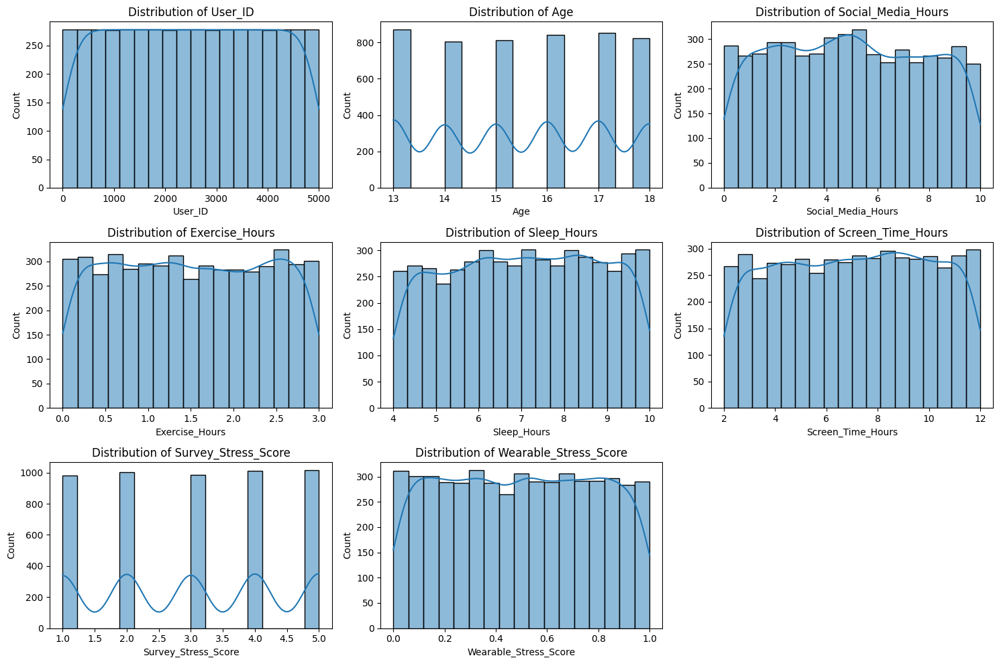

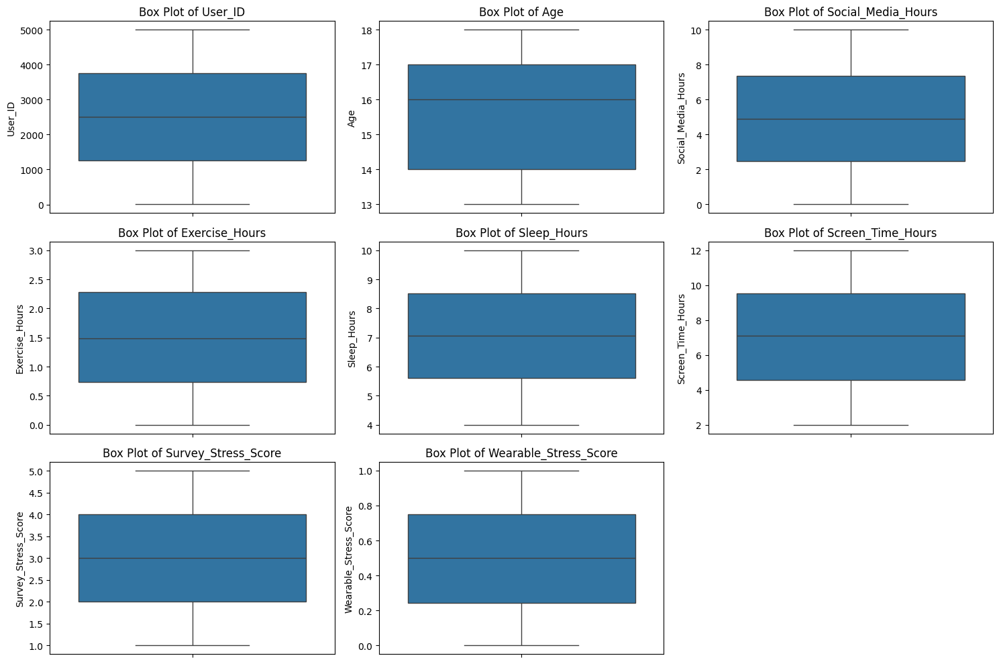

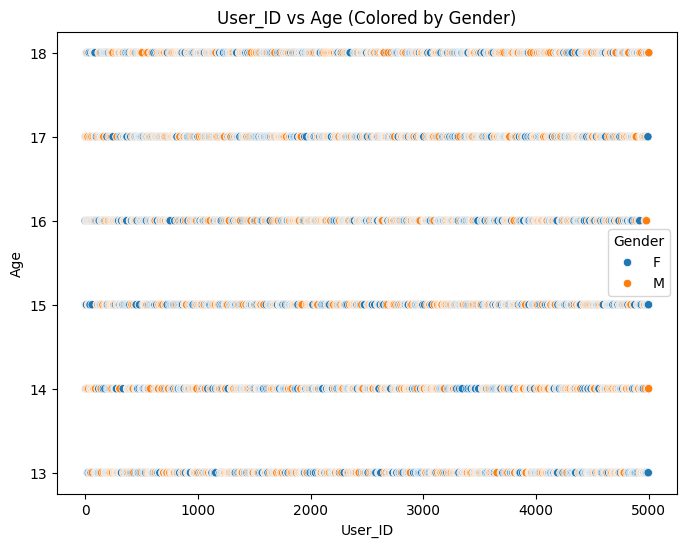

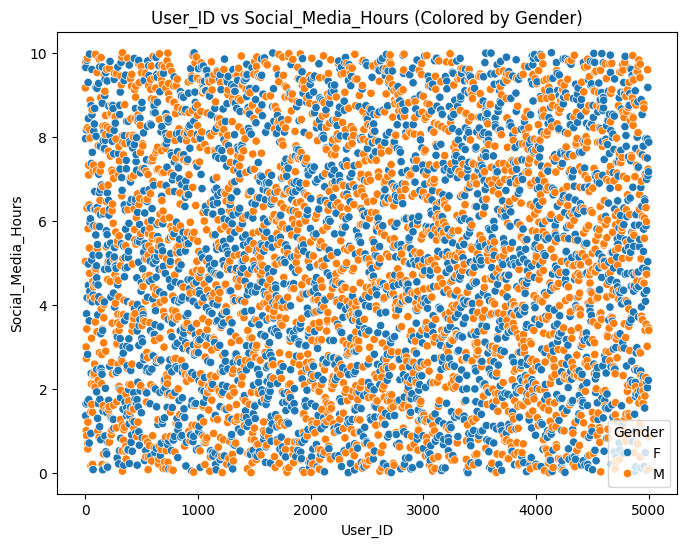

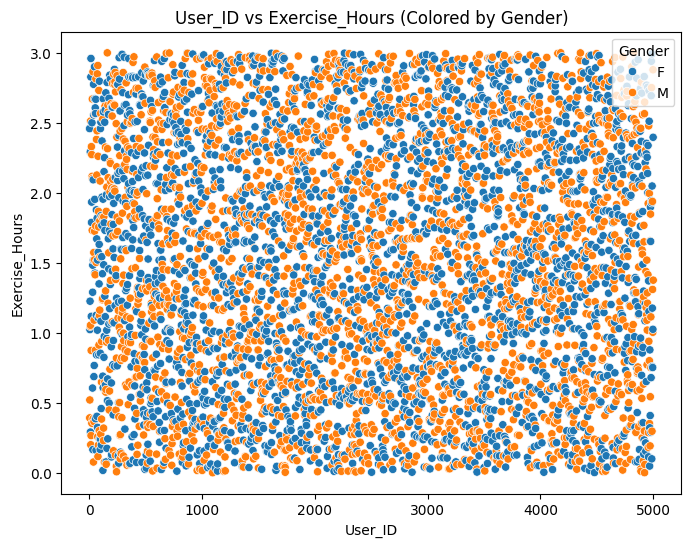

...

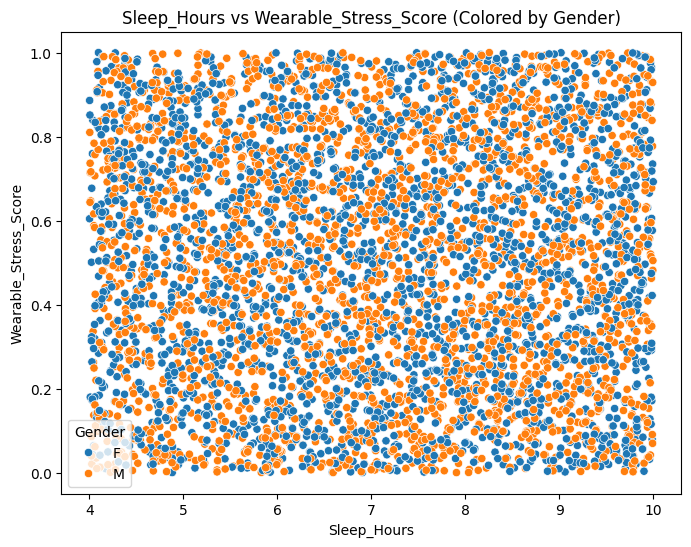

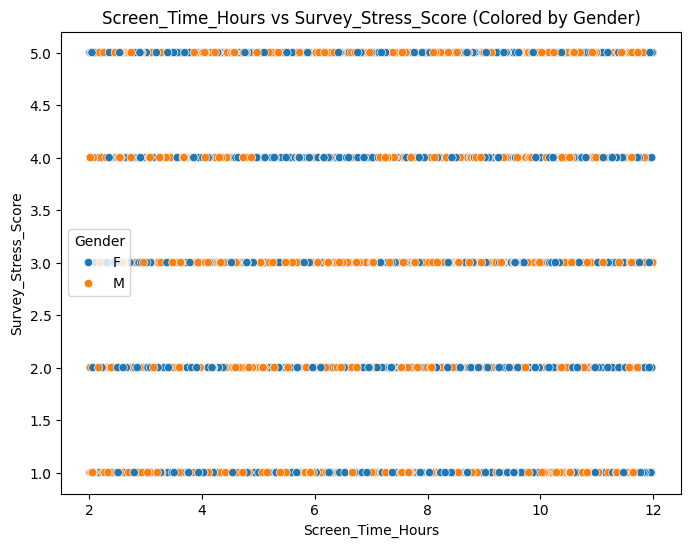

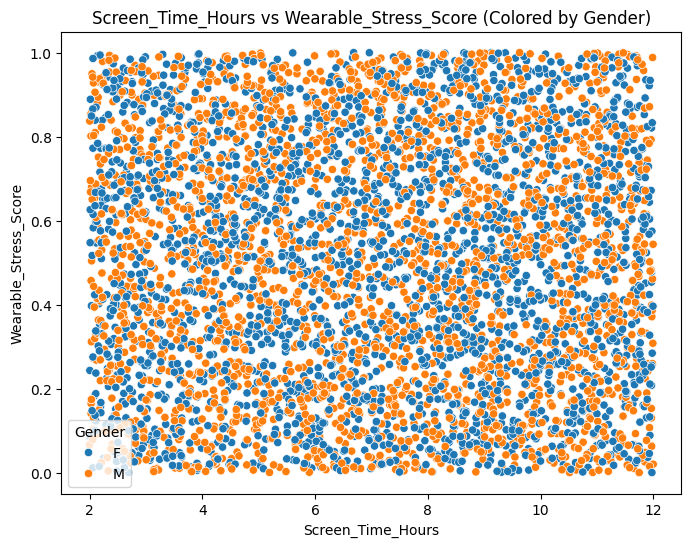

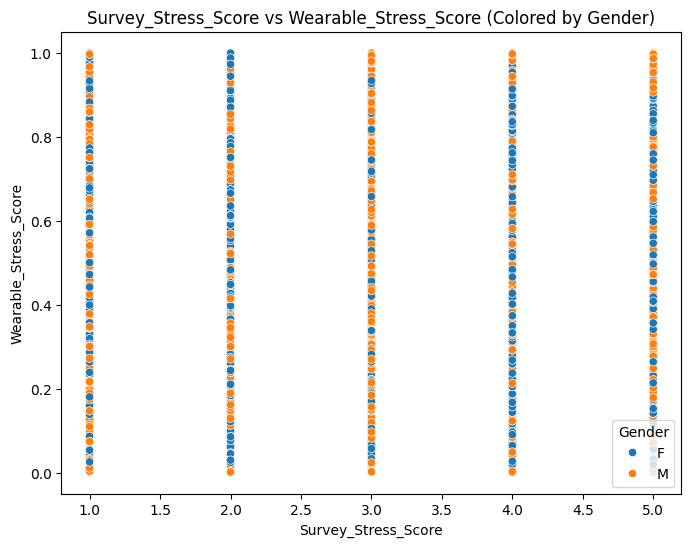

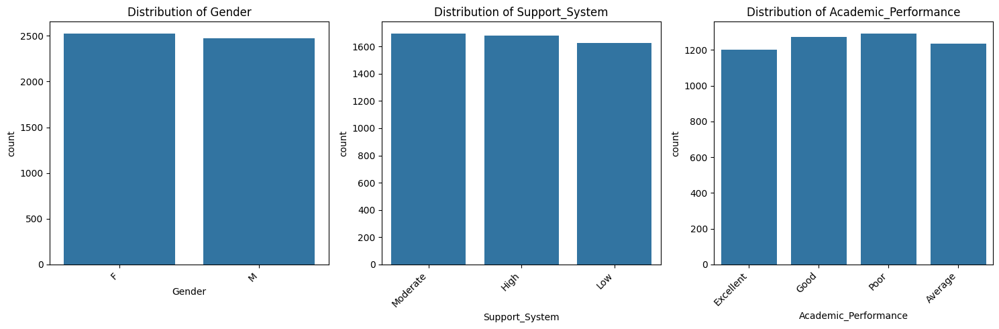

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Histograms with KDE for numerical features
plt.figure(figsize=(15, 10))
for i, col in enumerate(df.select_dtypes(include=['number']).columns):
    plt.subplot(3, 3, i + 1)
    sns.histplot(df[col], kde=True)
    plt.title(f'Distribution of {col}')
plt.tight_layout()
plt.show()

# Box plots for numerical features
plt.figure(figsize=(15, 10))
for i, col in enumerate(df.select_dtypes(include=['number']).columns):
    plt.subplot(3, 3, i + 1)
    sns.boxplot(y=df[col])
    plt.title(f'Box Plot of {col}')
plt.tight_layout()
plt.show()

# Scatter plots for pairs of numerical features colored by categorical features
numerical_cols = df.select_dtypes(include=['number']).columns
for i in range(len(numerical_cols)):
    for j in range(i + 1, len(numerical_cols)):
        plt.figure(figsize=(8, 6))
        sns.scatterplot(x=df[numerical_cols[i]], y=df[numerical_cols[j]], hue=df['Gender'])
        plt.title(f'{numerical_cols[i]} vs {numerical_cols[j]} (Colored by Gender)')
        plt.show()

# Bar charts for categorical features
plt.figure(figsize=(15, 5))
for i, col in enumerate(df.select_dtypes(include=['object']).columns):
    plt.subplot(1, 3, i + 1)
    sns.countplot(x=df[col])
    plt.title(f'Distribution of {col}')
    plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

#Feature Engineering

In [ ]:
# Example: Create a feature representing the ratio of screen time to sleep hours
df['Screen_Sleep_Ratio'] = df['Screen_Time_Hours'] / df['Sleep_Hours']

print(df.head())

   User_ID  Age Gender  Social_Media_Hours  Exercise_Hours  Sleep_Hours  \
0        1   16      F            9.654486        2.458001     5.198926   
1        2   17      M            9.158143        0.392095     8.866097   
2        3   15      M            5.028755        0.520119     4.943095   
3        4   17      F            7.951103        1.022630     5.262773   
4        5   17      F            1.357459        1.225462     6.196080   

   Screen_Time_Hours  Survey_Stress_Score  Wearable_Stress_Score  \
0           8.158189                    3               0.288962   
1           5.151993                    5               0.409446   
2           9.209325                    2               0.423837   
3           9.823658                    5               0.666021   
4          11.338990                    5               0.928060   

  Support_System Academic_Performance  Screen_Sleep_Ratio  \
0       Moderate            Excellent            1.569207   
1       Moderate  

#Combined Stress Score

In [ ]:
df['Combined_Stress_Score'] = (df['Survey_Stress_Score'] + df['Wearable_Stress_Score']) / 2

#Hypothesis Testing



#Hypothesis 1:
There is a significant difference in average stress levels between males and females.

In [ ]:
import pandas as pd
from scipy import stats

# Assuming 'df' is your DataFrame

# Separate stress scores for males and females
male_stress = df[df['Gender'] == 'Male']['Combined_Stress_Score']
female_stress = df[df['Gender'] == 'Female']['Combined_Stress_Score']

# Perform independent samples t-test
t_statistic, p_value = stats.ttest_ind(male_stress, female_stress)

# Print the results
print(f"T-statistic: {t_statistic}")
print(f"P-value: {p_value}")

# Interpret the results
alpha = 0.05  # Significance level
if p_value < alpha:
    print("Reject the null hypothesis: There is a significant difference in average stress levels between males and females.")
else:
    print("Fail to reject the null hypothesis: There is no significant difference in average stress levels between males and females.")

T-statistic: nan
P-value: nan
Fail to reject the null hypothesis: There is no significant difference in average stress levels between males and females.


<ipython-input-17-29d08be9ab81>:11: SmallSampleWarning: One or more sample arguments is too small; all returned values will be NaN. See documentation for sample size requirements.
  t_statistic, p_value = stats.ttest_ind(male_stress, female_stress)


#Hypothesis 2:
Average stress levels differ significantly across different support systems.

In [ ]:
import pandas as pd
from scipy import stats

# Assuming 'df' is your DataFrame

# Perform one-way ANOVA
groups = df['Support_System'].unique()
fvalue, pvalue = stats.f_oneway(*[df['Combined_Stress_Score'][df['Support_System'] == g] for g in groups])

# Print the results
print(f"F-statistic: {fvalue}")
print(f"P-value: {pvalue}")

# Interpret the results
alpha = 0.05  # Significance level
if pvalue < alpha:
    print("Reject the null hypothesis: Average stress levels differ significantly across different support systems.")
else:
    print("Fail to reject the null hypothesis: Average stress levels do not differ significantly across different support systems.")

F-statistic: 0.6693520071179022
P-value: 0.5120861722589839
Fail to reject the null hypothesis: Average stress levels do not differ significantly across different support systems.


#Hypothesis 3:
 There is a significant correlation between sleep hours and stress levels.

In [ ]:
import pandas as pd
from scipy import stats

# Assuming 'df' is your DataFrame

# Calculate Pearson's correlation coefficient
correlation, p_value = stats.pearsonr(df['Sleep_Hours'], df['Combined_Stress_Score'])

# Print the results
print(f"Correlation coefficient: {correlation}")
print(f"P-value: {p_value}")

# Interpret the results
alpha = 0.05  # Significance level
if p_value < alpha:
    print("Reject the null hypothesis: There is a significant correlation between sleep hours and stress levels.")
else:
    print("Fail to reject the null hypothesis: There is no significant correlation between sleep hours and stress levels.")

Correlation coefficient: 0.021222137268191027
P-value: 0.13350422305678167
Fail to reject the null hypothesis: There is no significant correlation between sleep hours and stress levels.


# Which age group has higher stress levels on average?

<ipython-input-20-081aa5dd20d1>:14: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  age_group_stress = df.groupby('Age_Group')['Combined_Stress_Score'].mean()


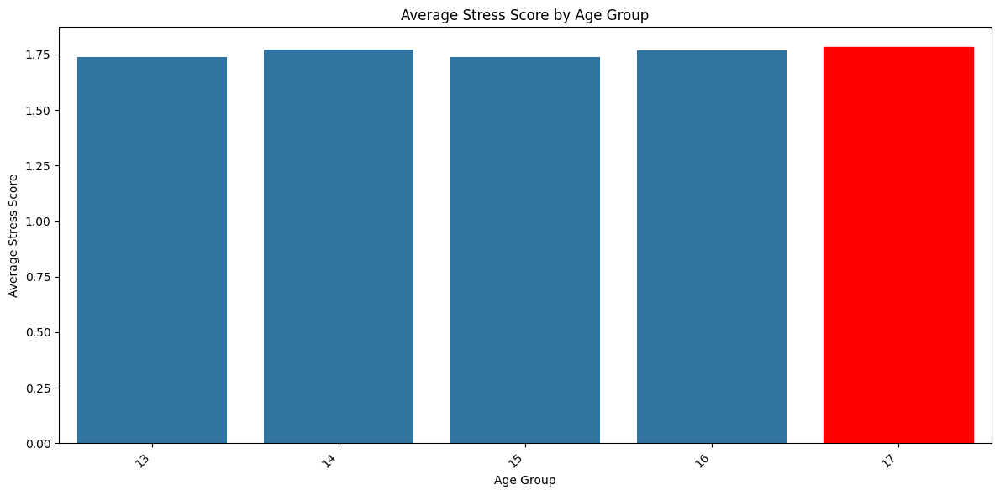

The age group with the maximum stress is: 17


In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Assuming 'df' is your DataFrame

# 1. Create Age Groups with Range 1
age_bins = list(range(13, 19, 1))  # Bins starting from 13 to 18 (inclusive) with range 1
age_labels = [f'{i}' for i in age_bins[:-1]]  # Labels for the bins
df['Age_Group'] = pd.cut(df['Age'], bins=age_bins, labels=age_labels, right=True, include_lowest=True)

# 2. Group by Age Group and Calculate Average Stress
age_group_stress = df.groupby('Age_Group')['Combined_Stress_Score'].mean()

# 3. Find Age Group with Maximum Stress
max_stress_age_group = age_group_stress.idxmax()

# 4. Visualize the Results with adjusted x-axis limits
plt.figure(figsize=(12, 6))  # Increased figure width for better visibility
barplot = sns.barplot(x=age_group_stress.index, y=age_group_stress.values)

# Highlight the maximum stress age group
for bar in barplot.containers[0]:
    if bar.get_x() + bar.get_width()/2 == age_group_stress.index.get_loc(max_stress_age_group):
        bar.set_color('red')

plt.title('Average Stress Score by Age Group')
plt.xlabel('Age Group')
plt.ylabel('Average Stress Score')
plt.xticks(rotation=45, ha='right')
plt.xlim(-0.5, len(age_group_stress) - 0.5)  # Adjust x-axis limits to show all age groups
plt.tight_layout()
plt.show()

# 5. Print the Age Group with Maximum Stress
print(f"The age group with the maximum stress is: {max_stress_age_group}")

#Which gender has higher stress levels?

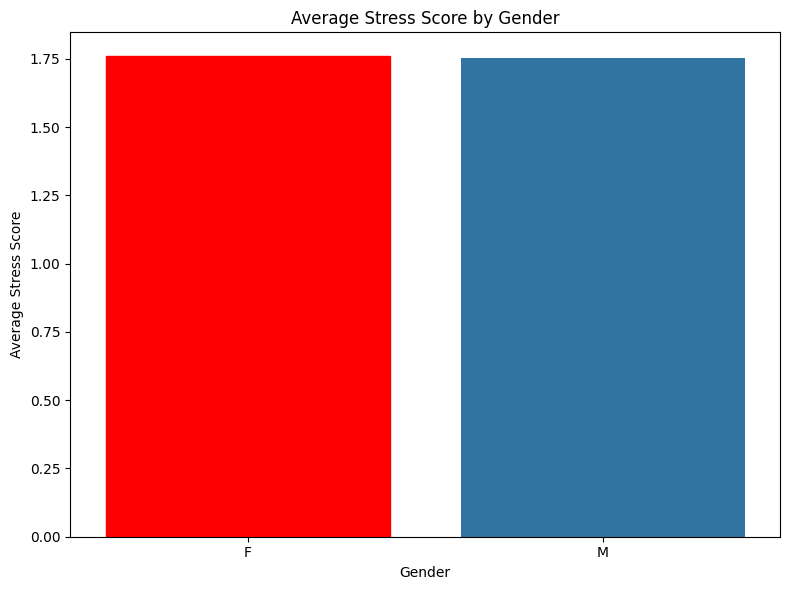

Average Stress Score by Gender:
Gender
F    1.758897
M    1.753460
Name: Combined_Stress_Score, dtype: float64
Gender with maximum stress is F


In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Assuming 'df' is your DataFrame

# Group by Gender and calculate average stress
gender_stress = df.groupby('Gender')['Combined_Stress_Score'].mean()
max_gender_stress = gender_stress.idxmax()#gender with maximum stress

# 4. Visualize the Results with adjusted x-axis limits
# Visualize the results
plt.figure(figsize=(8, 6))
gender_plot=sns.barplot(x=gender_stress.index, y=gender_stress.values)
for bar in gender_plot.containers[0]:
    if bar.get_x() + bar.get_width()/2 == gender_stress.index.get_loc(max_gender_stress):
        bar.set_color('red')
plt.title('Average Stress Score by Gender')
plt.xlabel('Gender')
plt.ylabel('Average Stress Score')
plt.tight_layout()
plt.show()

# Print average stress score for each gender
print("Average Stress Score by Gender:")
print(gender_stress)
print("Gender with maximum stress is "+max_gender_stress)

#How does the average stress score vary across different support systems?

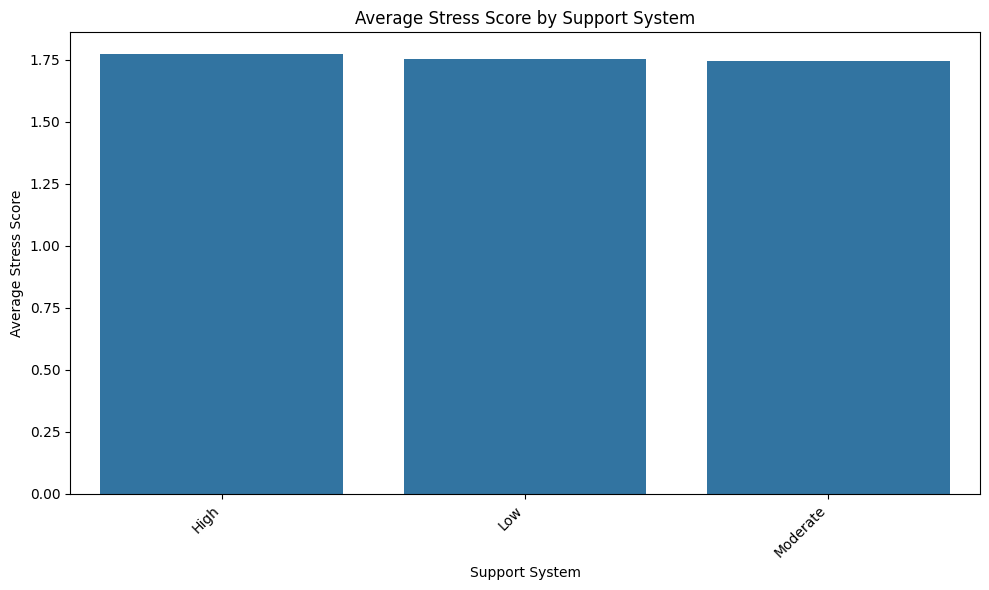

Average Stress Score by Support System:
Support_System
High        1.771850
Low         1.753383
Moderate    1.743454
Name: Combined_Stress_Score, dtype: float64


In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Assuming 'df' is your DataFrame

# Group by Support System and calculate average stress
support_stress = df.groupby('Support_System')['Combined_Stress_Score'].mean()

# Visualize the results
plt.figure(figsize=(10, 6))
sns.barplot(x=support_stress.index, y=support_stress.values)
plt.title('Average Stress Score by Support System')
plt.xlabel('Support System')
plt.ylabel('Average Stress Score')
plt.xticks(rotation=45, ha='right')  # Rotate x-axis labels for better readability
plt.tight_layout()
plt.show()

# Print average stress score for each support system
print("Average Stress Score by Support System:")
print(support_stress)

#What is the distribution of exercise hours among participants?

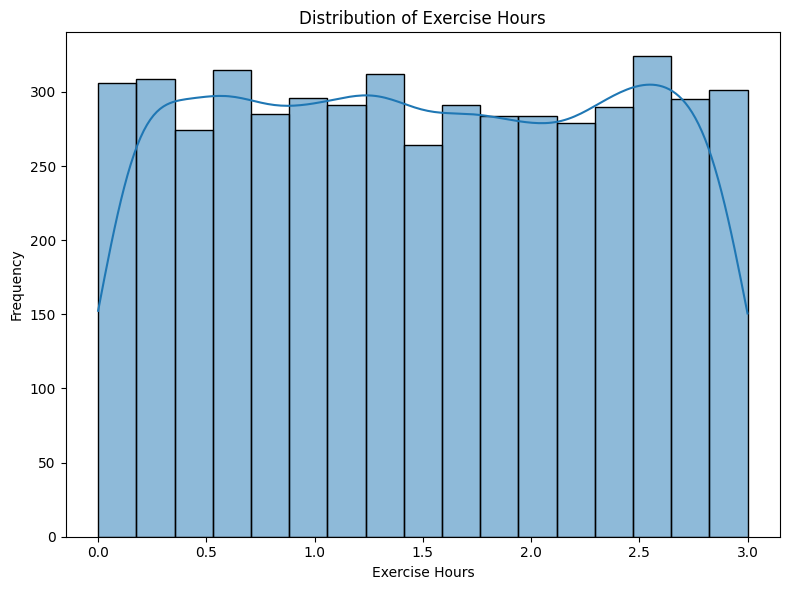

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Assuming 'df' is your DataFrame

# Create a histogram of exercise hours
plt.figure(figsize=(8, 6))
sns.histplot(df['Exercise_Hours'], kde=True)  # kde=True adds a kernel density estimate curve
plt.title('Distribution of Exercise Hours')
plt.xlabel('Exercise Hours')
plt.ylabel('Frequency')
plt.tight_layout()
plt.show()

# Do individuals with higher screen time tend to have higher stress levels?

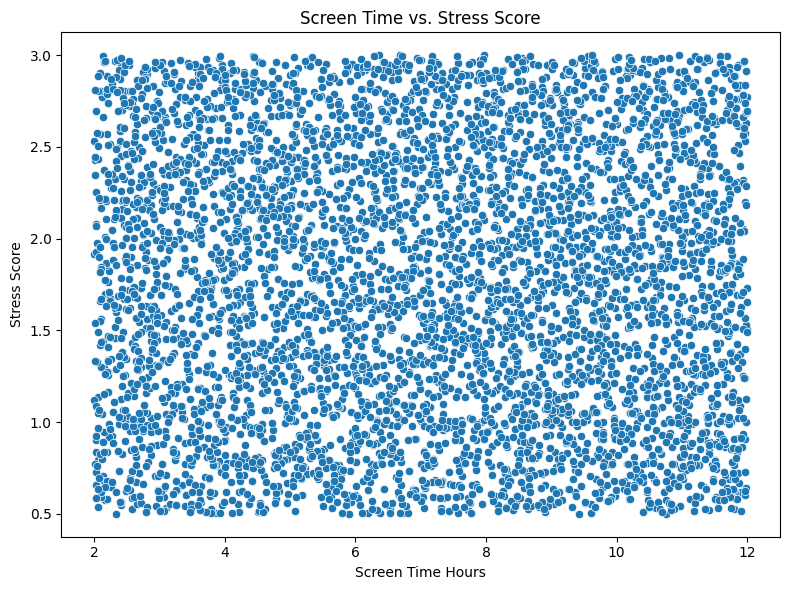

Correlation between screen time and stress score: -0.006061484153162399


In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Assuming 'df' is your DataFrame

# Create a scatter plot of screen time vs. stress score
plt.figure(figsize=(8, 6))
sns.scatterplot(x='Screen_Time_Hours', y='Combined_Stress_Score', data=df)
plt.title('Screen Time vs. Stress Score')
plt.xlabel('Screen Time Hours')
plt.ylabel('Stress Score')
plt.tight_layout()
plt.show()

# Calculate correlation between screen time and stress score
correlation = df['Screen_Time_Hours'].corr(df['Combined_Stress_Score'])
print(f"Correlation between screen time and stress score: {correlation}")